<h1>Content</h1>

<div class="alert alert-block alert-info" style="margin-top: 10px">
    <ol>
        <li><a href="#1">Load Libraries</a></li>
        <li><a href="#2">Load Dataset</a></li>
        <li><a href="#3">Explore Dataset</a></li>
        <li><a href="#4">Prepare Dataset</a></li>
            <ol>
                <li><a href="#5">Drop Missing Values</a></li>
                <li><a href="#6">Drop Duplicates</a></li>
            </ol>
        <li><a href="#7">Text Pre-processing</a></li>
            <ol>
                <li><a href="#8">Drop The Special Chars</a></li>
                <li><a href="#9">Make Lower Chars</a></li>
                <li><a href="#10">Drop Stop-Words</a></li>
                <li><a href="#11">Stemming</a></li>
                <li><a href="#12">Count Vector (Bag of Words)</a></li>
                <li><a href="#13">Let's Make Prediction with Count Vector</a></li>
                <li><a href="#14">TF - IDF and Prediction</a></li>
                <li><a href="#15">Word2Vec</a></li>
                    <ol>
                        <li><a href="#16">Avg Word2Vector</a></li>
                        <li><a href="#17">TF-IDF Weighted Word2Vec</a></li>
                        <li><a href="#18">TF-IDF Weighted Word2Vec For Brand & Color Features</a></li>                     
                    </ol>
           </ol>
        <li><a href="#19">Extract Features with CNN</a></li>
            <ol>
                <li><a href="#20">Use Pre-Trained Models</a></li>
            </ol>
        <li><a href="#21">Combine Models</a></li>
    </ol>
</div>
<br>
<hr>

<a id="1"></a>
## Load Libraries

In [631]:
from PIL import Image # read images
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from bs4 import BeautifulSoup # web scraping
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout
import itertools

plotly.offline.init_notebook_mode(connected=True)
import warnings
warnings.filterwarnings("ignore")

<a id="2"></a>
## Load Dataset

In [15]:
data = pd.read_json('tops_fashion.json')

<a id="3"></a>
## Explore Dataset

In [16]:
data.shape

(183138, 19)

In [17]:
data.columns

Index(['sku', 'asin', 'product_type_name', 'formatted_price', 'author',
       'color', 'brand', 'publisher', 'availability', 'reviews',
       'large_image_url', 'availability_type', 'small_image_url',
       'editorial_review', 'title', 'model', 'medium_image_url',
       'manufacturer', 'editorial_reivew'],
      dtype='object')

I will use only 6 features.
    1. asin  ( Amazon standard identification number)(unique number)
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.) (information about products)
    7. formatted_price (price of the product)

In [18]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [19]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


## Feature:product_type_name

In [20]:
# Count of Products:
data["product_type_name"].nunique()

72

In [21]:
# Missng Values Control:
data["product_type_name"].isnull().sum()

0

In [22]:
# Percentage of Products: Top 10
data["product_type_name"].value_counts()[:10] # to see percentage:normalize=True

SHIRT                         167794
APPAREL                         3549
BOOKS_1973_AND_LATER            3336
DRESS                           1584
SPORTING_GOODS                  1281
SWEATER                          837
OUTERWEAR                        796
OUTDOOR_RECREATION_PRODUCT       729
ACCESSORY                        636
UNDERWEAR                        425
Name: product_type_name, dtype: int64

## Feature:brand

In [23]:
# Count of Brand:
data["brand"].nunique()

10577

In [24]:
# Missng Values Control:
data["brand"].isnull().sum()

151

In [25]:
# Percentage of Products: Top 10
data["brand"].value_counts()[:10]

Zago                         223
XQS                          222
Yayun                        215
YUNY                         198
XiaoTianXin-women clothes    193
Generic                      192
Boohoo                       190
Alion                        188
Abetteric                    187
TheMogan                     187
Name: brand, dtype: int64

## Feature:color

In [26]:
# Count of Color:
data["color"].nunique()

7380

In [27]:
# Missng Values Control:
data["color"].isnull().sum()

118182

In [28]:
# Percentage of Products: Top 10
data["color"].value_counts()[:10]

Black    13207
White     8616
Blue      3570
Red       2289
Pink      1842
Grey      1499
*         1388
Green     1258
Multi     1203
Gray      1189
Name: color, dtype: int64

## Feature:formatted_price

In [29]:
# Missng Values Control:
data["formatted_price"].isnull().sum()

154743

In [30]:
# Percentage of Price Is NOT missing:
((len(data["formatted_price"]) - data["formatted_price"].isnull().sum()) / len(data["formatted_price"])) * 100

15.504701372735314

In [31]:
data["formatted_price"].describe()

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object

## Feature:title

In [32]:
# very good count of title
data["title"].describe()

count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object

<a id="4"></a>
## Prepare Dataset

<a id="5"></a>
* Drop Missing Values

In [33]:
# Make a copy of dataset
data2 = data.copy()

In [34]:
# Drop missing values from price column:
data2 = data2.loc[~data["formatted_price"].isnull()]
data2.shape

(28395, 7)

In [35]:
# Drop missing values from color column:
data2 = data2.loc[~data["color"].isnull()]
data2.shape

(28385, 7)

<a id="6"></a>
* Drop Duplicates

In [36]:
# Count of duplicates:
data2.duplicated("title").sum()

2325

In [37]:
# 1-Ignore rows less than 4 words in "title" 
# count:
data2['title'].apply(lambda x: len(x.split())<=4).sum()

436

In [38]:
# Make list Comp.
data3 = data2[data2['title'].apply(lambda x: len(x.split())>4)]
data3.shape

(27949, 7)

In [39]:
# Sort data to compare eachother in title column
data3.sort_values('title',inplace=True, ascending=False)
data3.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


In [40]:
# we make here; 
# in title column, 
# compere 1.row and 2.row than, 2-3, 3-4,.....
# if difference bigger than "2 words",
# we keep them.
duplicates = []
for i in range(len(data3)-1):
    #if i < (len(data3)-1): # to provide getting an error:i+1
    a = data3['title'].iloc[i].split()
    b = data3['title'].iloc[i+1].split()

    # keep the maximum length of two strings
    length = max(len(a), len(b))

    # to keep matches words' count
    count = 0 

    # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
    for k in itertools.zip_longest(a,b): 
        if k[0] == k[1]:
            count += 1
    if (length - count) > 2: # number of words in which both sensences differ
        # if both strings are differ by more than 2 words we include the 1st string index
        duplicates.append(data3['asin'].iloc[i])
        #duplicates.append(data3['asin'].iloc[i+1])

In [41]:
# Drop duplicates:
data4 = data3.loc[data['asin'].isin(duplicates)]

In [42]:
data4.shape

(17495, 7)

In [43]:
data5 = data4.copy()

In [90]:
indices = []
for i,row in data5.iterrows():
    indices.append(i)

In [76]:
# compare sentences and drop lenght<3

duplicates = []
while len(indices)!=0:
    i = indices.pop()
    duplicates.append(data5['asin'].loc[i])
    # consider the first apperal's title
    a = data5['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:
        
        b = data5['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [512]:
data6 = data5.loc[data['asin'].isin(duplicates)]

In [88]:
data6.shape

(16367, 7)

<a id="7"></a>
## Text Pre-processing

<a id="8"></a>
### Drop The Special Chars

In [637]:
# drop the special chars in review like '"#$@!%^&*()_+-~?>< etc.
data6["title"] = data6["title"].str.replace("[^\w\s]","")
data6.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Womens Printed Thin Strap Blouse Black ...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long Tshirts ...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens White Long Sleeve Single Breas...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank PatchBear Sleeve Anchor ...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


<a id="9"></a>
### Make Lower Chars

In [638]:
# Make lower characters:
data6["title"] = data6["title"].apply(lambda x: " ".join(i.lower() for i in x.split()))
data6.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,éclair womens printed thin strap blouse black ...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming womens sleeveless loose long tshirts ...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming womens white long sleeve single breas...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming stripes tank patchbear sleeve anchor ...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming sleeve sheer loose tassel kimono woma...,$14.32


<a id="10"></a>
### Drop Stop-Words

In [639]:
# Drop Stop-Words:
sw = stopwords.words("english")
data6["title"] = data6["title"].apply(lambda x: " ".join(i for i in x.split() if i not in sw))
data6.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,éclair womens printed thin strap blouse black ...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming womens sleeveless loose long tshirts ...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming womens white long sleeve single breas...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming stripes tank patchbear sleeve anchor ...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming sleeve sheer loose tassel kimono woma...,$14.32


In [642]:
data6.to_pickle("data6")

<a id="11"></a>
### Stemming

In [120]:
#st = PorterStemmer()

In [ ]:
# data6["title"] = data6["title"].apply(lambda x: " ".join(st.stem(word) for word in x))

<a id="12"></a>
## Count Vector (Bag of Words)

In [153]:
vectorizer = CountVectorizer()
vectorizer_title = vectorizer.fit_transform(data6["title"])

In [154]:
vectorizer_title.get_shape()

(16367, 12667)

<a id="13"></a>
## Let's Make Prediction with Count Vector

* ID : Clothes/t-shirt id / between 0-16367 
* num_results : How many predictions do you want to see

In [261]:
def count_model(ID,num_results):
    # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise_distances.html
    # Compute the distance matrix from a vector array X and optional Y.
    # sklearn.metrics.pairwise.pairwise_distances(X, Y=None, metric='euclidean')
    pairwise_distance = pairwise_distances(vectorizer_title,vectorizer_title[ID])
    
    # Returns the indices that would sort an array.
    # we make flatten the matris to make in one arary.
    indices = np.argsort(pairwise_distance.flatten())[0:num_results]
    
    # hide the smallest euclidean distance
    # it was not necessary for prediction, just want to show distance
    smallest_distance  = np.sort(pairwise_distance.flatten())[0:num_results]
    
    # use indices in dataset to find real positions
    df_indices = list(data6.index[indices])
    
    for i in range(len(df_indices)):
        print("Title: ",data6['title'].loc[df_indices[i]])
        print("Distance",smallest_distance[i])
                                           
        # take image's url
        url = data6['medium_image_url'].loc[df_indices[i]]
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        # show image
        plt.imshow(img)
        plt.show()

In [262]:
# indices: array([ 1354,  1353, 15143,  8171,  7520], dtype=int64)

Title:  azules womens solid color rayon span high low cap sleeved tunic rust l
Distance 0.0


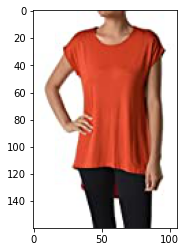

Title:  womens rayon span high low short sleeves tunic solid large coffee
Distance 3.0


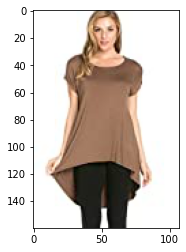

Title:  womens rayon span high low short sleeves tunic solid medium indigo blue
Distance 3.1622776601683795


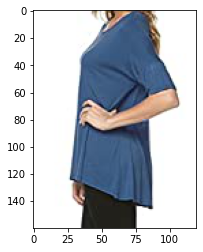

Title:  magaschoni womens cashmere tunic
Distance 3.4641016151377544


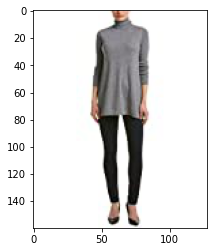

Title:  hayden womens offtheshoulder tunic l red
Distance 3.605551275463989


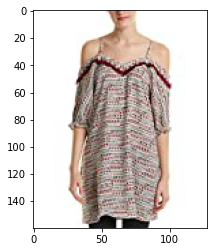

In [264]:
count_model(15143,5)

Title:  ten sixty sherman womens large sleeveless tank cami top green l
Distance 0.0


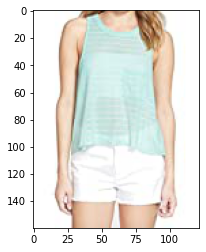

Title:  ten sixty sherman womens large fridge tank top black l
Distance 2.23606797749979


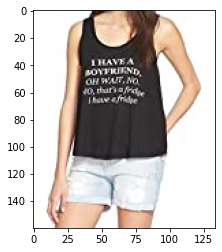

Title:  ten sixty sherman large junior sleeveless striped tank cami pink l
Distance 2.449489742783178


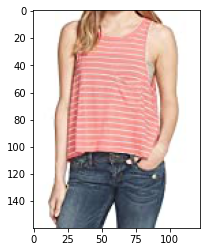

Title:  ten sixty sherman gray womens small striped tank top green
Distance 2.449489742783178


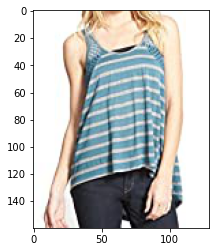

Title:  ten sixty sherman wheres food womens large tank top white l
Distance 2.449489742783178


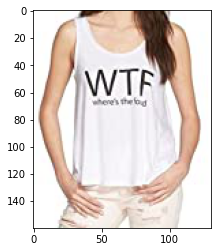

Title:  womens tank top dark green
Distance 2.6457513110645907


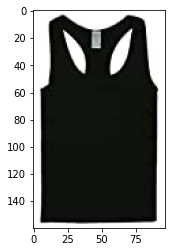

Title:  ten sixty sherman womens mrscool tank knit top 16
Distance 2.6457513110645907


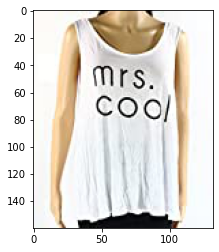

Title:  ten sixty sherman womens large striped knit top white l
Distance 2.6457513110645907


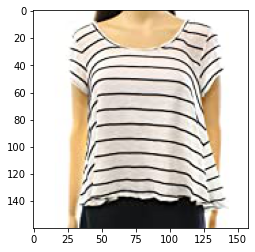

Title:  soprano womens small sleeveless pocket tank cami top green
Distance 2.6457513110645907


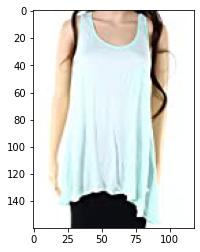

Title:  signorelli womens sleeveless tank top white large
Distance 2.6457513110645907


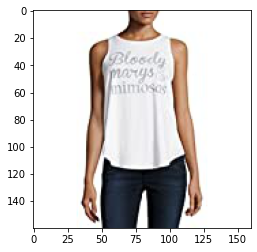

In [270]:
count_model(2983,10)

Title:  daniel rainn navy womens plus vneck printed blouse blue 1x
Distance 0.0


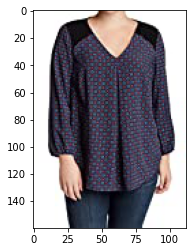

Title:  daniel rainn womens plus chiffon crochet blouse blue 1x
Distance 2.23606797749979


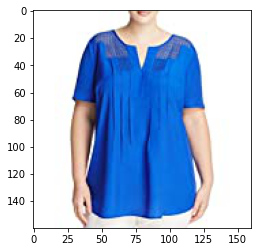

Title:  daniel rainn womens plus printed keyhole smocked blouse
Distance 2.449489742783178


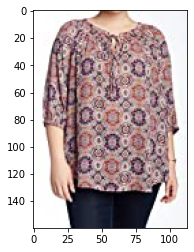

Title:  balance collection women plus vneck printed blouse blue 1x
Distance 2.6457513110645907


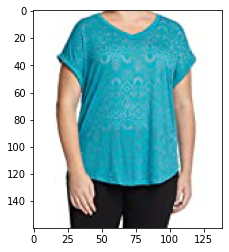

Title:  daniel rainn womens plus drawstring splitneck blouse
Distance 2.6457513110645907


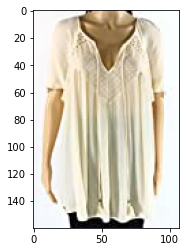

In [274]:
count_model(12920,5)

<a id="14"></a>
## TF - IDF
* words-importance
* TF: Word Freq in title
* IDF: log(total title count / which titles has "word_1" )
    * If idf is big, it means "word_1" rare.

In [277]:
# Make Model:
tf_idf_word_vectorizer = TfidfVectorizer()
tf_idf_title = tf_idf_word_vectorizer.fit_transform(data6["title"])

In [287]:
def tf_idf_model(ID,num_results):
    # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise_distances.html
    # Compute the distance matrix from a vector array X and optional Y.
    # sklearn.metrics.pairwise.pairwise_distances(X, Y=None, metric='euclidean')
    pairwise_distance = pairwise_distances(tf_idf_title,tf_idf_title[ID])
    
    # Returns the indices that would sort an array.
    # we make flatten the matris to make in one arary.
    indices = np.argsort(pairwise_distance.flatten())[0:num_results]
    
    # hide the smallest euclidean distance
    # it was not necessary for prediction, just want to show distance
    smallest_distance  = np.sort(pairwise_distance.flatten())[0:num_results]
    
    # use indices in dataset to find real positions
    df_indices = list(data6.index[indices])
    
    for i in range(len(df_indices)):
        print("Title: ",data6['title'].loc[df_indices[i]])
        print("Distance",smallest_distance[i])
                                           
        # take image's url
        url = data6['medium_image_url'].loc[df_indices[i]]
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        # show image
        plt.imshow(img)
        plt.show()

Title:  azules womens solid color rayon span high low cap sleeved tunic rust l
Distance 0.0


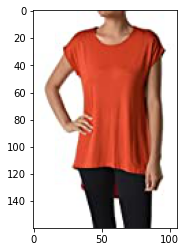

Title:  womens rayon span high low short sleeves tunic solid large coffee
Distance 0.9474906282797527


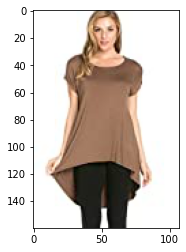

Title:  womens rayon span high low short sleeves tunic solid medium indigo blue
Distance 0.9563776025106882


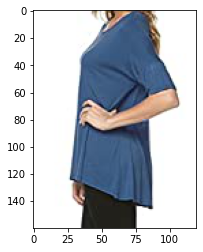

Title:  womens rayon span comfortable 34 sleeve tunic top solid medium navy
Distance 1.0808959429593312


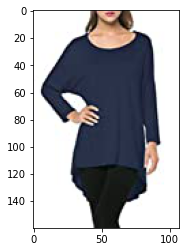

Title:  womens poly span various print high low tunic 34 sleeves print small a86
Distance 1.1732867947489312


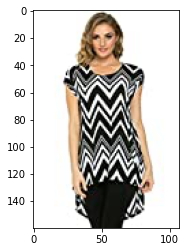

In [288]:
tf_idf_model(15143,5)

Title:  ten sixty sherman womens large sleeveless tank cami top green l
Distance 0.0


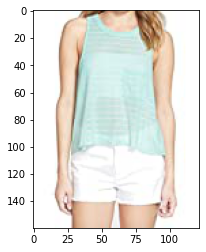

Title:  ten sixty sherman large junior sleeveless striped tank cami pink l
Distance 0.6193217336131731


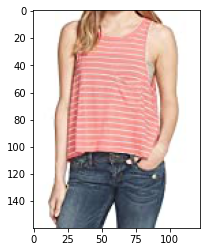

Title:  ten sixty sherman gray womens small striped tank top green
Distance 0.6839176699091996


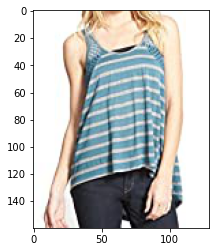

Title:  ten sixty sherman womens large striped knit top white l
Distance 0.7417246229116542


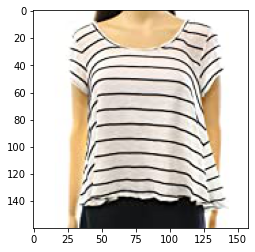

Title:  ten sixty sherman burgundy large junior knit tank cami purple l
Distance 0.7731682926936116


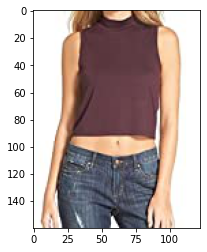

Title:  ten sixty sherman womens small printed scoopneck tank top black
Distance 0.7946396434296882


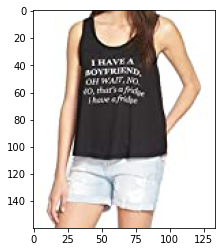

Title:  ten sixty sherman womens small scoop neck printed tank top white
Distance 0.8083919273179856


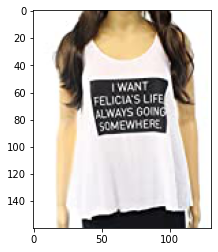

Title:  ten sixty sherman womens large fridge tank top black l
Distance 0.81413832403967


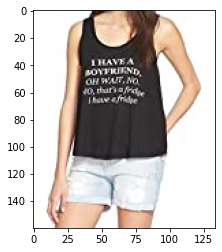

Title:  ten sixty sherman womens medium striped knit top gray
Distance 0.8373930524173664


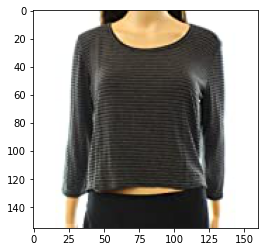

Title:  ten sixty sherman womens medium graphic print knit top black
Distance 0.8399994822720663


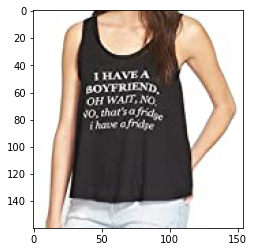

In [281]:
tf_idf_model(2983,10)

Title:  daniel rainn navy womens plus vneck printed blouse blue 1x
Distance 0.0


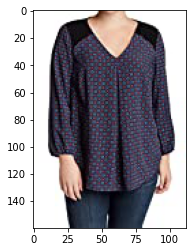

Title:  daniel rainn womens plus chiffon crochet blouse blue 1x
Distance 0.7097205257695142


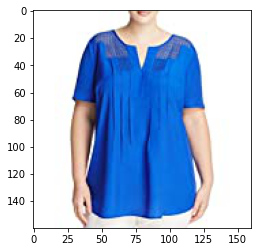

Title:  daniel rainn blue womens large printed knit blouse purple l
Distance 0.8229874637963033


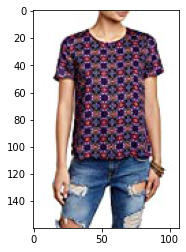

Title:  daniel rainn black womens floral lace vneck blouse blue xl
Distance 0.8359360697975919


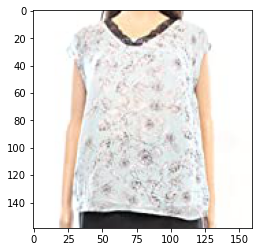

Title:  daniel rainn womens medium crochet sheer printed blouse blue
Distance 0.8503013084344105


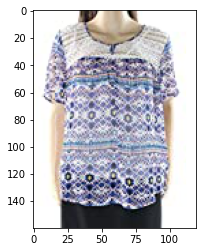

In [282]:
tf_idf_model(12920,5)

Title:  recycled karma womens medium tank unplugged blouse black
Distance 0.0


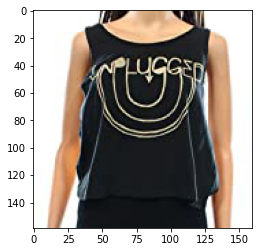

Title:  recycled karma womens graphic tank white
Distance 0.885801099939557


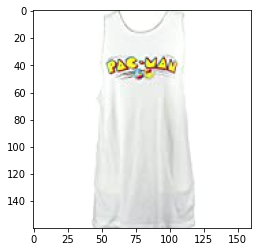

Title:  recycled karma womens large graphic print tank top black l
Distance 0.9033483419323626


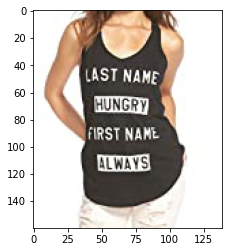

Title:  recycled karma womens small crewneck printed tank top black
Distance 0.9303092330008276


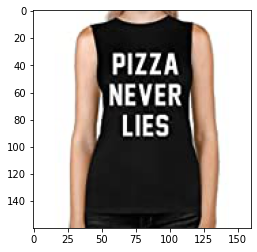

Title:  recycled karma bright womens medium scoop neck tank top white
Distance 0.9504988041156666


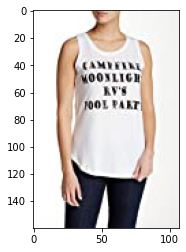

In [291]:
tf_idf_model(4946,5)

<a id="15"></a>
## Word2Vec
* Use Google News Vectors(Pre-trained ML model)
* Word2vec basically place the word in the feature space is such a way that their location is determined by their meaning i.e. words having similar meaning are clustered together and the distance between two words also have the same meaning.

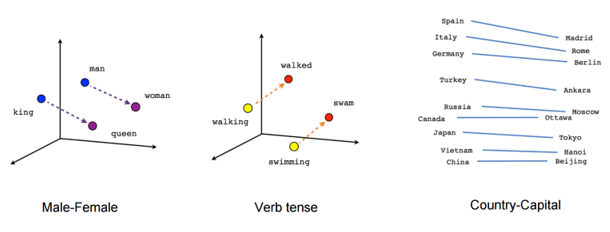

### Cosine Similarity

* lets first understand what is cosine similarity because word2vec uses cosine similarity for finding out the most similar word. Cosine similarity is not only telling the similarity between two vectors but it also test for orthogonality of vector

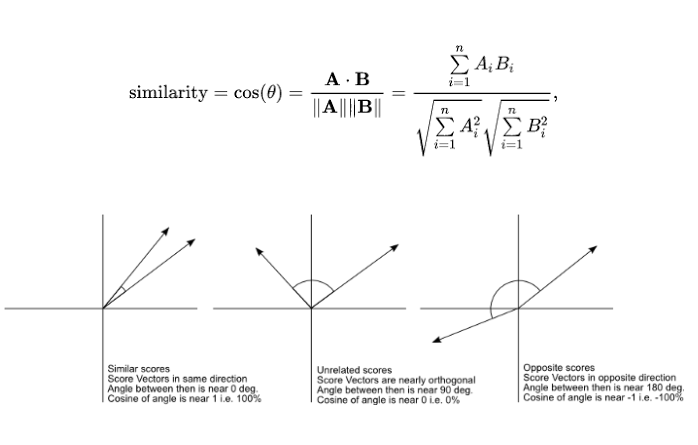

* if angle are close to zero than we can say that vectors are very similar to each other and if theta is 90 than we can say vectors are orthogonal to each other (orthogonal vector not related to each other ) and if theta is 180 we can say that both the vector are opposite to each other.

In [299]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors

In [301]:
model = KeyedVectors.load_word2vec_format("GoogleNews-vectors-negative300.bin",binary=True)

In [308]:
# count of words
vocab = model.wv.vocab
len(vocab)

3000000

<a id="16"></a>
### Avg Word2Vector

* It tries to learn the relationship between vector automatically from raw text. larger the dimension it has, larger it is rich in information the vector is.

### properties:
* 1- if word w1 and w2 are similar than vector v1 and v2 will be closer.
* 2- automatic learn the relationship between words/vector.


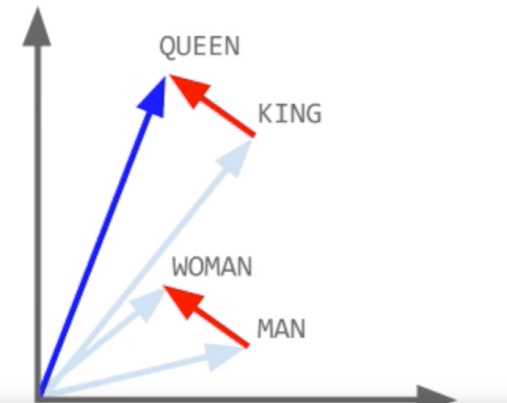

### how to convert each document to vector?
* suppose you have w1, w2, …wn word in one document(row). in order to convert into vector.
* each word has one vector, we will convert average word2vec than divide by the number of word in a document.

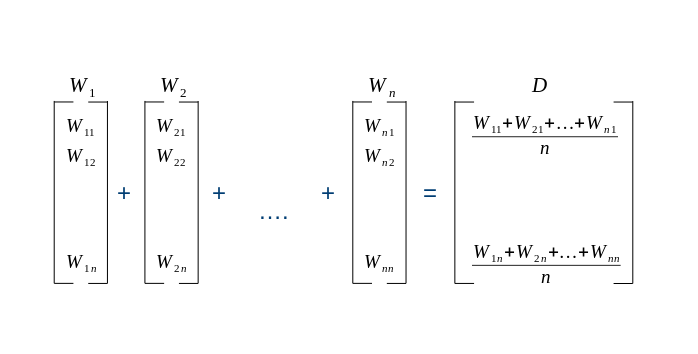

In [458]:
# create the new word2vec
def w2v_vectorize(x):
    sent_vectors = []
    coeff = 0
    vector = np.zeros((300,))
    for word in x.split():
        coeff += 1
        if word in vocab:
            vector += model[word]      
    if coeff != 0:
        vector = vector / coeff    
    return np.array(vector)

In [459]:
avg_word2vector = []
for i in data6['title']:
    avg_word2vector.append(w2v_vectorize(i))

In [460]:
def avg_w2v_model(ID,num_results):
    # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise_distances.html
    # Compute the distance matrix from a vector array X and optional Y.
    # sklearn.metrics.pairwise.pairwise_distances(X, Y=None, metric='euclidean')
    pairwise_distance = pairwise_distances(avg_word2vector,avg_word2vector[ID].reshape(1,-1))
    
    # Returns the indices that would sort an array.
    # we make flatten the matris to make in one arary.
    indices = np.argsort(pairwise_distance.flatten())[0:num_results]
    
    # hide the smallest euclidean distance
    # it was not necessary for prediction, just want to show distance
    smallest_distance  = np.sort(pairwise_distance.flatten())[0:num_results]
    
    # use indices in dataset to find real positions
    df_indices = list(data6.index[indices])
    
    for i in range(len(df_indices)):
        print("Title: ",data6['title'].loc[df_indices[i]])
        print("Distance",smallest_distance[i])
                                           
        # take image's url
        url = data6['medium_image_url'].loc[df_indices[i]]
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        # show image
        plt.imshow(img)
        plt.show()

Title:  women fashion best friends printed best pattern one sleeveless crop top
Distance 0.0


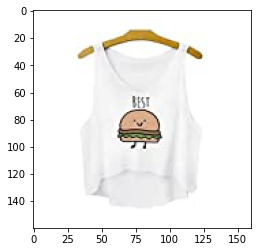

Title:  women fashion cute best friend printed white pattern two sleeveless crop top
Distance 0.45341305514516844


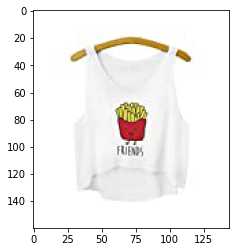

Title:  women best best friends printed white sleeveless crop top
Distance 0.4704469372652408


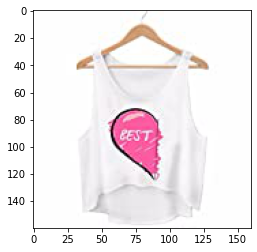

Title:  women fashion pow printed white pattern one sleeveless crop top
Distance 0.6438682102965246


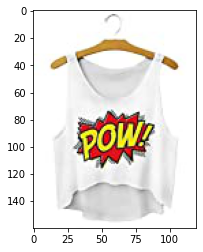

Title:  women bff version best printed white sleeveless crop top
Distance 0.6701324388283327


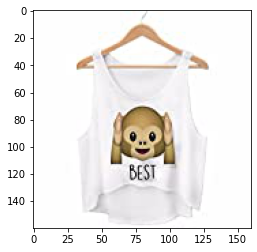

Title:  women sexy fashion pattern one leaves printed white halter crop top
Distance 0.6967772731631375


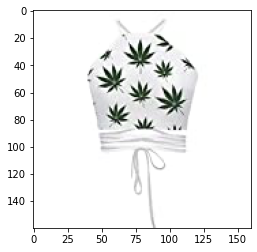

Title:  women fashion cool quote printed sleeveless crop top
Distance 0.7022360549061315


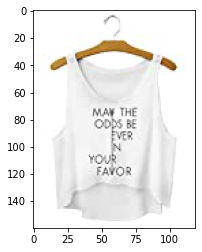

Title:  women fashion cool kids printed white sleeveless crop top
Distance 0.7047988147957562


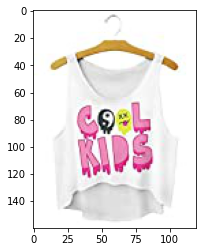

Title:  women summer fashion tshirt cool aliens printed pattern one short sleeve crop top
Distance 0.7109045497816723


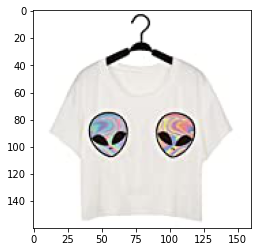

Title:  women sexy fashion pattern one elephant printed black crop top
Distance 0.7269571332015713


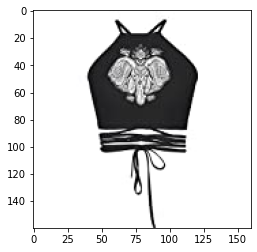

In [461]:
avg_w2v_model(1514,10)

Title:  tee miracle womens cute cat fashionista kitty short sleeve casual graphics shirt
Distance 2.1073424255447017e-08


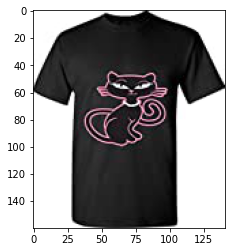

Title:  unisex hipster clothing cute cat cat 3d short sleeve tshirt tee xxl
Distance 0.7358555123953286


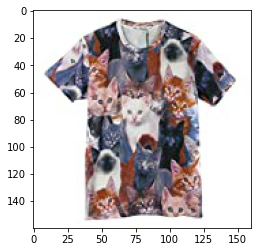

Title:  unisex hipster clothing cute cat cat shirt 3d short sleeve tshirt tee tops xl
Distance 0.7585529574739943


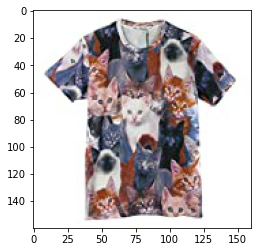

Title:  yichun summer casual short sleeve three cats cartoon tshirt tops tee women girl
Distance 0.7768048943387494


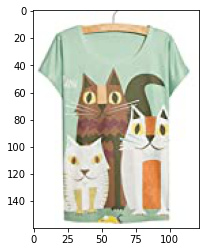

Title:  futurino womens poker faced kitten family print short sleeve tops casual tee
Distance 0.8113828080606474


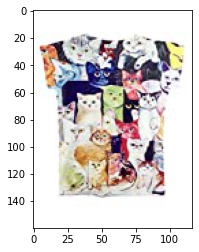

Title:  yichun summer cute cats printing tshirt short sleeve tops women tees tunic
Distance 0.8183207794703419


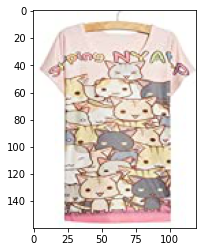

Title:  jitm womens cute cartoon milk box print short sleeve top shirt tee
Distance 0.8221900204038363


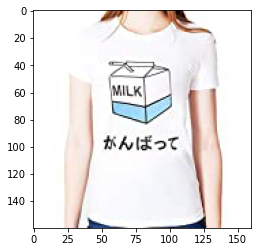

Title:  focal20 women cute cactus print tshirt short sleeve white tee colorful graphic round neck tops shirt
Distance 0.8268681966752907


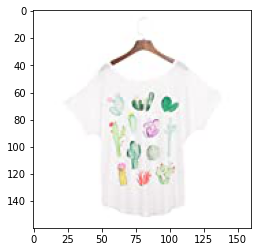

Title:  focal20 women pineapple print tshirt tearing hole design tee cute short sleeve tops
Distance 0.831162964576385


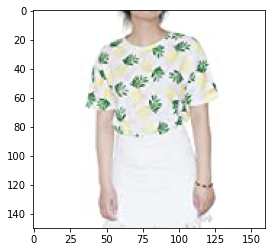

Title:  clothingloves womens summer short sleeve purecolor comfy loose casual tee tshirt
Distance 0.8348543632195513


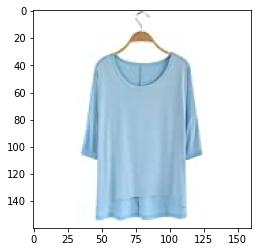

In [462]:
avg_w2v_model(3043,10)

Title:  elizabeth james womens bonnie jersey tee peach xsmall
Distance 0.0


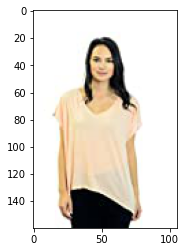

Title:  james perse womens slub jersey tee heather grey 3
Distance 0.7225608344479642


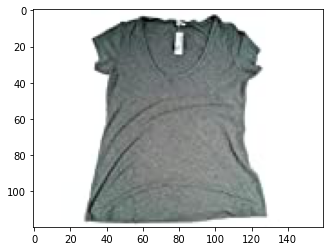

Title:  elizabeth james womens octavia tee black xsmall
Distance 0.7587032973013783


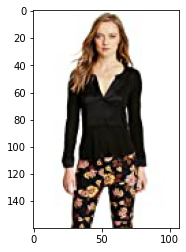

Title:  james perse striped dolman slub jersey tee white 3
Distance 0.945911943195531


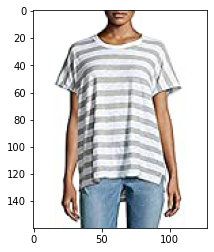

Title:  james perse ruched side white tee shirt 3
Distance 0.9593687837797259


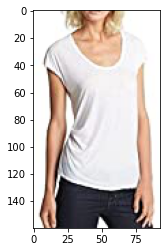

In [463]:
avg_w2v_model(12020,5)

Title:  recycled karma womens medium tank unplugged blouse black
Distance 0.0


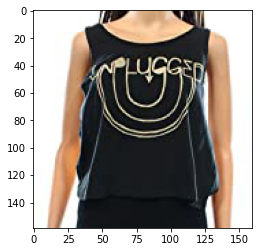

Title:  recycled karma womens medium day print tank cami shirt white
Distance 0.659096903065019


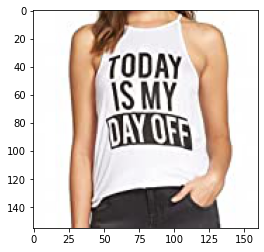

Title:  recycled karma womens medium layz vneck knit tank top black
Distance 0.6615429153534405


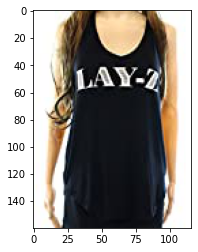

Title:  recycled karma womens medium first brunch blouse white
Distance 0.7232267223469784


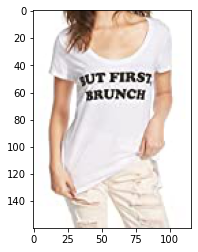

Title:  recycled karma womens small crewneck printed tank top black
Distance 0.7292540286948481


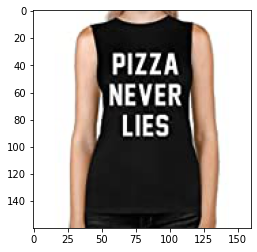

Title:  recycled karma womens medium hello friday print tank top black
Distance 0.7498539738277086


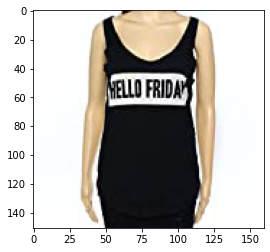

Title:  recycled karma womens today day tank cami shirt white xl
Distance 0.7614974830695633


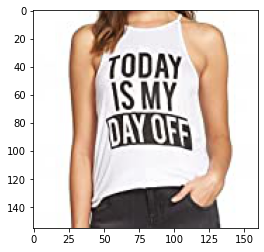

Title:  recycled karma taupe womens small distraction tank top black
Distance 0.7708343789519411


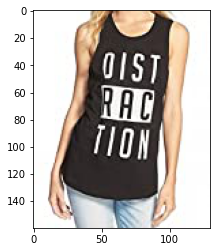

Title:  recycled karma bright womens medium scoop neck tank top white
Distance 0.7740930930453017


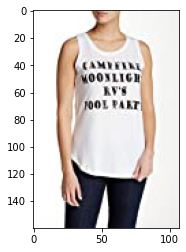

Title:  recycled karma womens large halter printed tank top white l
Distance 0.78813904110795


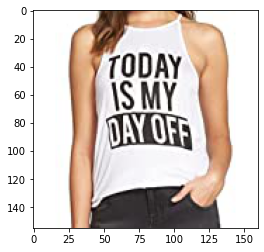

In [464]:
avg_w2v_model(4946,10)

<a id="17"></a>
### TF-IDF Weighted Word2Vec

In [478]:
# create the new word2vec
def tfidf_w2v_vectorize(x,ID):
    sent_vectors = []
    coeff = 0
    vector = np.zeros((300,))
    for word in x.split():
        coeff += 1
        if word in vocab and word in tf_idf_word_vectorizer.vocabulary_:
            vector += model[word] * tf_idf_title[ID,tf_idf_word_vectorizer.vocabulary_[word]]      
    if coeff != 0:
        vector = vector / coeff    
    return np.array(vector)

In [479]:
tfidf_word2vector = []
ID = 0
for i in data6['title']:
    tfidf_word2vector.append(tfidf_w2v_vectorize(i,ID))
    ID += 1

In [469]:
def tfidf_w2v_model(ID,num_results):
    # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise_distances.html
    # Compute the distance matrix from a vector array X and optional Y.
    # sklearn.metrics.pairwise.pairwise_distances(X, Y=None, metric='euclidean')
    pairwise_distance = pairwise_distances(tfidf_word2vector,tfidf_word2vector[ID].reshape(1,-1))
    
    # Returns the indices that would sort an array.
    # we make flatten the matris to make in one arary.
    indices = np.argsort(pairwise_distance.flatten())[0:num_results]
    
    # hide the smallest euclidean distance
    # it was not necessary for prediction, just want to show distance
    smallest_distance  = np.sort(pairwise_distance.flatten())[0:num_results]
    
    # use indices in dataset to find real positions
    df_indices = list(data6.index[indices])
    
    for i in range(len(df_indices)):
        print("Title: ",data6['title'].loc[df_indices[i]])
        print("Distance",smallest_distance[i])
                                           
        # take image's url
        url = data6['medium_image_url'].loc[df_indices[i]]
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        # show image
        plt.imshow(img)
        plt.show()

Title:  recycled karma womens medium tank unplugged blouse black
Distance 0.0


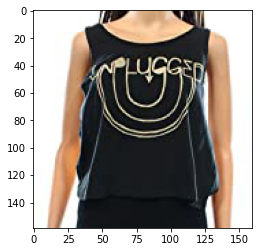

Title:  recycled karma womens medium layz vneck knit tank top black
Distance 0.2833553992769343


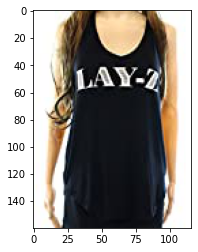

Title:  recycled karma womens medium day print tank cami shirt white
Distance 0.29197567026933685


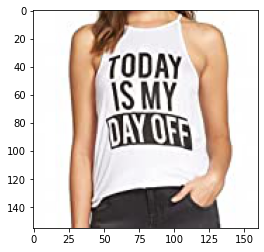

Title:  recycled karma womens small crewneck printed tank top black
Distance 0.2962958014393443


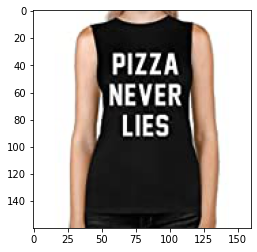

Title:  recycled karma womens large graphic print tank top black l
Distance 0.3006033983069364


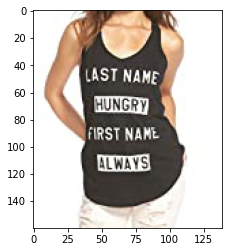

Title:  recycled karma bright womens medium scoop neck tank top white
Distance 0.302717888605477


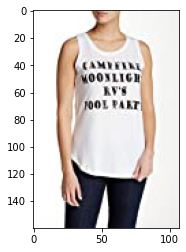

Title:  recycled karma womens large vneck graphic tee tshirt black l
Distance 0.3149406402401503


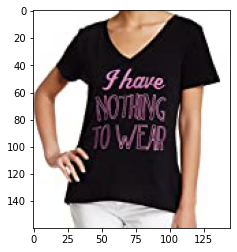

Title:  recycled karma womens today day tank cami shirt white xl
Distance 0.3151075516612423


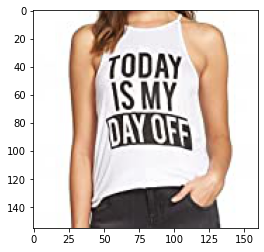

Title:  recycled karma womens large halter printed tank top white l
Distance 0.3155196257049742


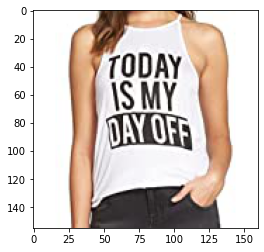

Title:  recycled karma womens large nothing wear tshirt black l
Distance 0.3235306042420115


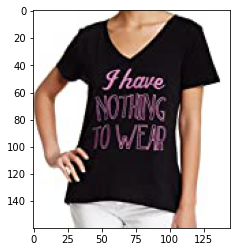

In [470]:
tfidf_w2v_model(4946,10)

Title:  elizabeth james womens bonnie jersey tee peach xsmall
Distance 1.0536712127723509e-08


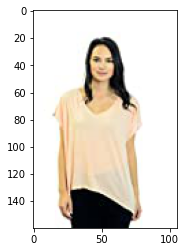

Title:  elizabeth james womens octavia tee black xsmall
Distance 0.28107334083010044


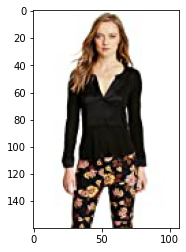

Title:  james perse womens slub jersey tee heather grey 3
Distance 0.2997164241352444


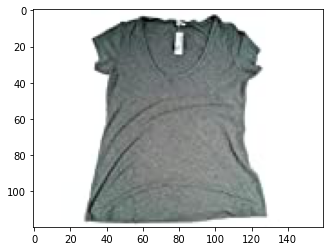

Title:  elizabeth james womens small layered blouse 128 purple
Distance 0.33570979029926223


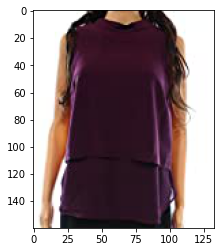

Title:  elizabeth james womens zoe silk peplum top black size xsmall
Distance 0.33879578561715323


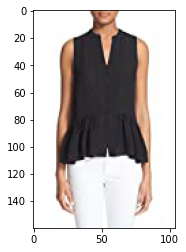

In [471]:
tfidf_w2v_model(12020,5)

Title:  tee miracle womens cute cat fashionista kitty short sleeve casual graphics shirt
Distance 0.0


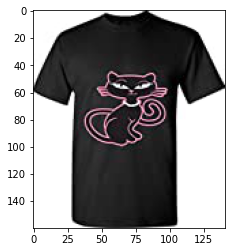

Title:  fashion woman calvin cute hobbes 34 sleeve black size
Distance 0.255439605679366


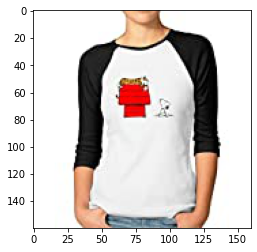

Title:  doxi crop top harajuku pug life dog women sexy slim shirt hipster vest tank top
Distance 0.27126751363881707


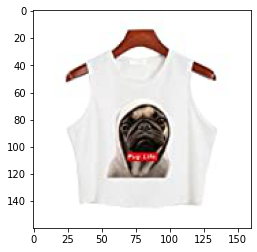

Title:  unisex hipster clothing cute cat cat shirt 3d short sleeve tshirt tee tops xl
Distance 0.27361954602907407


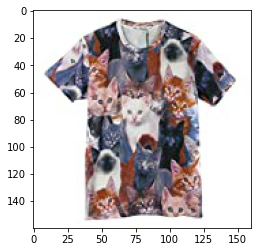

Title:  yichun summer casual short sleeve three cats cartoon tshirt tops tee women girl
Distance 0.27403713162301635


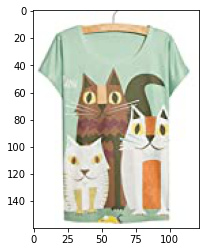

Title:  chic summer harajuku sexy crop top women emoji love casual short sleeve tshirt
Distance 0.27695487621058035


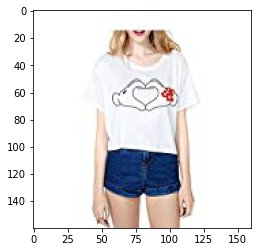

Title:  yichun summer cute cats printing tshirt short sleeve tops women tees tunic
Distance 0.2773639675773151


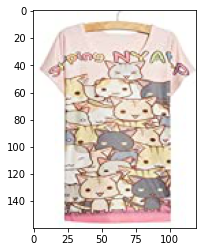

Title:  dorathy womens fashion cute pattern best cat crop top vest kawaii cropped tops
Distance 0.2776426305927157


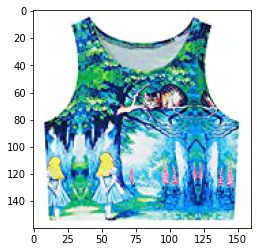

Title:  doxi women cute cat sexy crop top vest sleeveless shirt slim tank top girls
Distance 0.2780924958147236


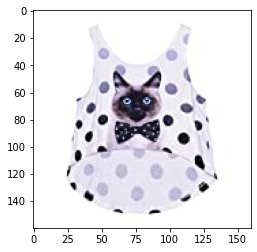

Title:  dorathy womens fashion cute cat pattern blue crop top vest kawaii cropped tops
Distance 0.2783829692301021


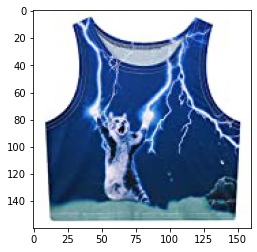

In [472]:
tfidf_w2v_model(3043,10)

Title:  NCAA Washington Huskies Womens M Soft Heather Vintage 3/4 Sleeves T-Shirt
Distance 1.0536712127723509e-08


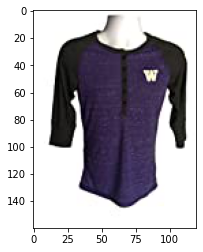

Title:  NCAA Sam Houston State Bearkats Women's Ladies' Long Sleeve Classic Polo, Sunkissed, Medium
Distance 0.3019739157588408


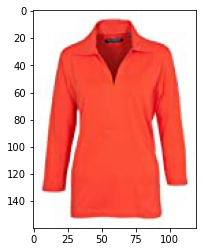

Title:  NCAA Kansas Jayhawks Women's Chloe Premium Terry Raglan Shirt, Large, Royal
Distance 0.30892210278340043


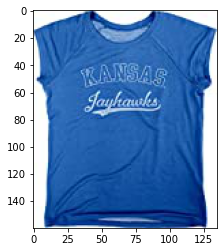

Title:  Lady's Idaho State University Bengals ISU Classic 3/4 Sleeve Raglan t shirt
Distance 0.3280946756994335


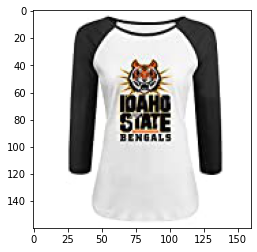

Title:  EVALY Women's Best University Of UTAH 3/4 Sleeve Raglan Tshirts
Distance 0.3349393239823653


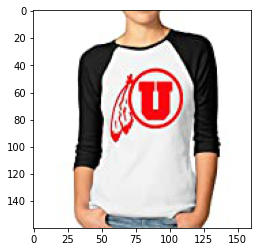

Title:  EVALY Women's Cool University Of UTAH 3/4-Sleeve Raglan Tshirt
Distance 0.33909101642271544


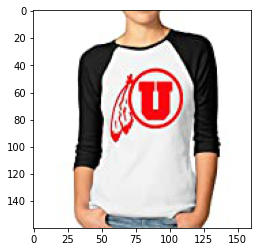

Title:  Polo Ralph Lauren Women's Large Team USA Knit Top Blue L
Distance 0.3399600934780082


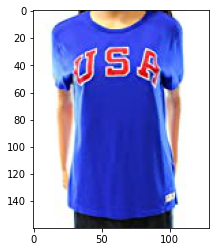

Title:  Chicago Local Pride by Todd Snyder Women's DA Best Raglan Tee (White / Navy, Medium)
Distance 0.34514260225072585


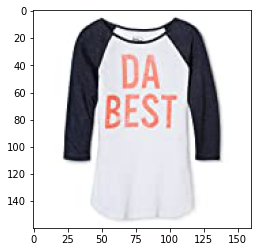

Title:  Polo Ralph Lauren Women's Large USA Knit Tee T-Shirt Red L
Distance 0.34692220052844713


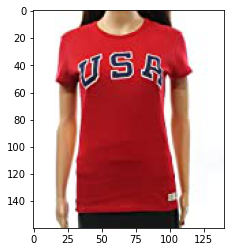

Title:  Dave Matthews Band Short Sleeve Easeful Womens Online T Cool Womens
Distance 0.3473669059537467


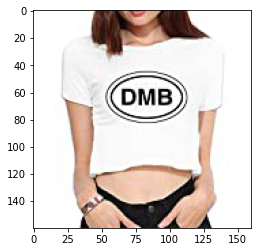

In [634]:
tfidf_w2v_model(6677,10)

<a id="18"></a>
### TF-IDF Weighted Word2Vec For Brand & Color Features

In [491]:
data6['brand'].fillna(value="Not given", inplace=True)

In [495]:
# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data6['brand'].values]
colors = [str(x).replace(" ", "-") for x in data6['color'].values]
type_name = [str(x).replace(" ", "-") for x in data6['product_type_name'].values]

In [514]:
# TF-IDF 
tf_idf_brands_vectorizer = TfidfVectorizer()
tf_idf_brands = tf_idf_brands_vectorizer.fit_transform(brands)

tf_idf_colors_vectorizer = TfidfVectorizer()
tf_idf_colors = tf_idf_colors_vectorizer.fit_transform(colors)

tf_idf_type_name_vectorizer = TfidfVectorizer()
tf_idf_type_name = tf_idf_type_name_vectorizer.fit_transform(colors)

In [515]:
color_brand = hstack((tf_idf_brands, tf_idf_colors,tf_idf_type_name)).tocsr()

In [516]:
def tf_idf_color_brand_model(ID,num_results,w1,w2):
    # w1: weight for tfidf
    # w2: weight for color&brand features
    
    
    # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise_distances.html
    # Compute the distance matrix from a vector array X and optional Y.
    # sklearn.metrics.pairwise.pairwise_distances(X, Y=None, metric='euclidean')
    tfidf_distance = pairwise_distances(tfidf_word2vector,tfidf_word2vector[ID].reshape(1,-1))
    color_brand_distance = pairwise_distances(color_brand,color_brand[ID])
    pairwise_distance = (w1 * tfidf_distance +  w2 * color_brand_distance)/float(w1 + w2)
    
    # Returns the indices that would sort an array.
    # we make flatten the matris to make in one arary.
    indices = np.argsort(pairwise_distance.flatten())[0:num_results]
    
    # hide the smallest euclidean distance
    # it was not necessary for prediction, just want to show distance
    smallest_distance  = np.sort(pairwise_distance.flatten())[0:num_results]
    
    # use indices in dataset to find real positions
    df_indices = list(data6.index[indices])
    
    for i in range(len(df_indices)):
        print("Title: ",data6['title'].loc[df_indices[i]])
        print("Distance",smallest_distance[i])
                                           
        # take image's url
        url = data6['medium_image_url'].loc[df_indices[i]]
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        # show image
        plt.imshow(img)
        plt.show()

Title:  Funny Special Olympics World Sports Games 2015 Women's T-shirt Black Size M
Distance 5.2161941226354e-11


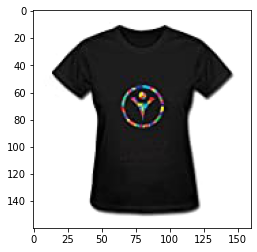

Title:  Cool Special Olympics World Sports Games 2015 Women's T Shirt SkyBlue Size M
Distance 0.0009706711879403089


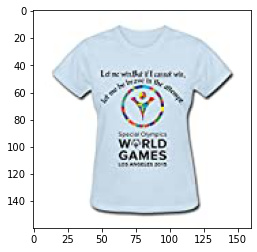

Title:  Women's Cute Tshirts - Special Olympics World Games 2015 SkyBlue Size M
Distance 0.0012152232787535635


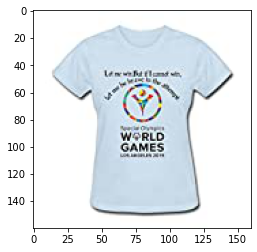

Title:  Women's Casual Tshirt - Special Olympics World Games 2015 Red Size XL
Distance 0.001218583480128153


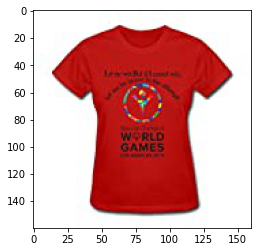

Title:  Women's Cool Tshirt - Special Olympics World Games 2015 RoyalBlue Size XXL
Distance 0.0012995104009999035


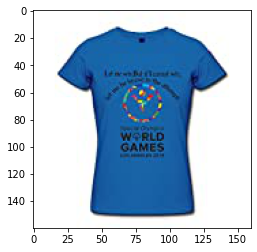

Title:  Women's New Style Tshirt - Special Olympics World Games 2015 SkyBlue Size S
Distance 0.00130254292110705


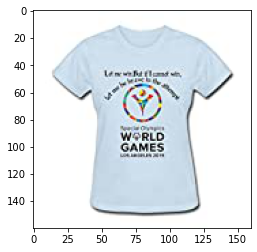

Title:  Women's Fashion Tshirts - Special Olympics World Games 2015 Pink Size L
Distance 0.0013204325025482516


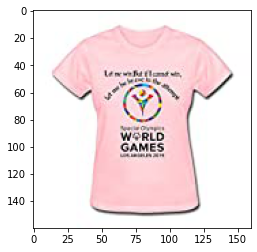

Title:  Women's Best Graphic Tshirts - Special Olympics World Games 2015 White Size XS
Distance 0.0013972104156352676


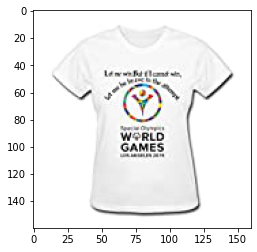

Title:  Women's New 100% Cotton T - Special Olympics World Games 2015 Red Size M
Distance 0.0014625837002460824


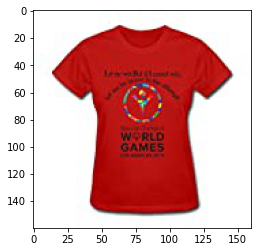

Title:  Women's Unique 100% Cotton T - Special Olympics World Games 2015 White Size L
Distance 0.0015482748905602222


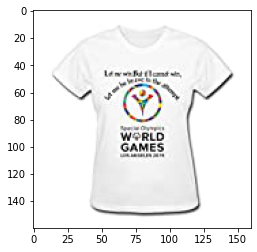

In [633]:
tf_idf_color_brand_model(10877,10,1,100)

Title:  Funny Special Olympics World Sports Games 2015 Women's T-shirt Black Size M
Distance 5.2161941226354004e-09


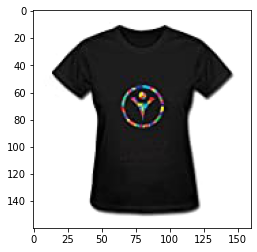

Title:  Cool Special Olympics World Sports Games 2015 Women's T Shirt SkyBlue Size M
Distance 0.09706711879403088


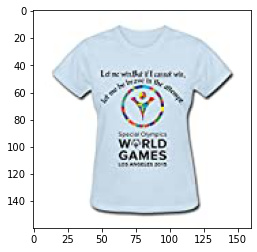

Title:  Women's Cute Tshirts - Special Olympics World Games 2015 SkyBlue Size M
Distance 0.12152232787535634


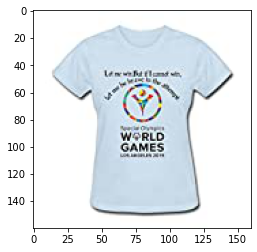

Title:  Women's Casual Tshirt - Special Olympics World Games 2015 Red Size XL
Distance 0.12185834801281531


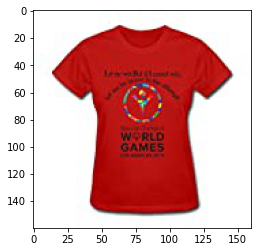

Title:  Women's Cool Tshirt - Special Olympics World Games 2015 RoyalBlue Size XXL
Distance 0.12995104009999034


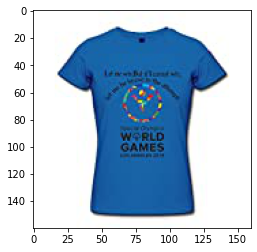

Title:  Women's New Style Tshirt - Special Olympics World Games 2015 SkyBlue Size S
Distance 0.13025429211070502


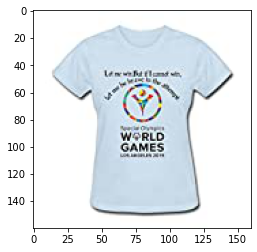

Title:  Women's Fashion Tshirts - Special Olympics World Games 2015 Pink Size L
Distance 0.13204325025482513


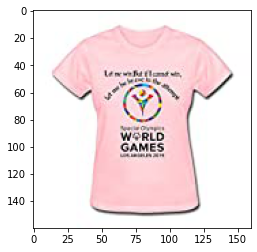

Title:  Women's Best Graphic Tshirts - Special Olympics World Games 2015 White Size XS
Distance 0.13972104156352674


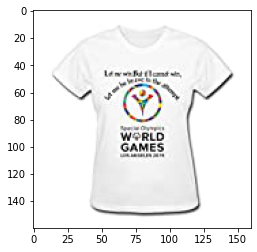

Title:  Women's New 100% Cotton T - Special Olympics World Games 2015 Red Size M
Distance 0.14625837002460826


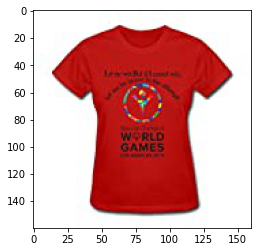

Title:  Women's Unique 100% Cotton T - Special Olympics World Games 2015 White Size L
Distance 0.15482748905602223


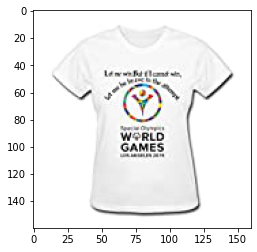

In [518]:
tf_idf_color_brand_model(10877,10,100,1)

Title:  Azules Women's Solid Color Rayon Span High Low Cap Sleeved Tunic - Rust, L
Distance 0.0


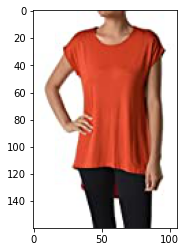

Title:  Women'S Rayon Span High & Low Short Sleeves Tunic - Solid (MEDIUM, Indigo Blue)
Distance 0.09735320723908727


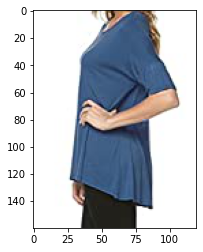

Title:  Hount Womens V-neck Long Sleeve Floral Print High Low Hem Blouse Tops (L, Red)
Distance 0.10358030413647912


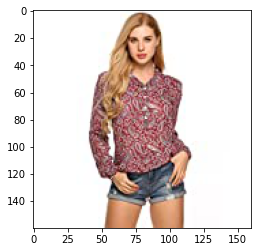

Title:  Bignow Plus Size Tshirt Tops Solid White Short Sleeved Blouse Wide Hem 4XL White
Distance 0.10407850831696543


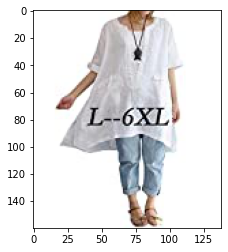

Title:  Women'S Rayon Span High & Low Short Sleeves Tunic - Solid (LARGE, Coffee)
Distance 0.10493212404994656


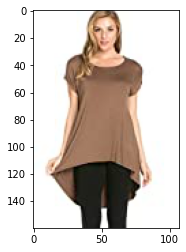

Title:  Women's Rayon Span Comfortable 3/4 Sleeve Tunic Top- Solid (Medium, Navy)
Distance 0.10549878841993895


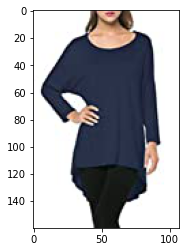

Title:  Zeagoo Women's Casual 3/4 Sleeve V Neck Top Tee Solid Color Tunic Top Blouse Plus Size
Distance 0.10592715585514906


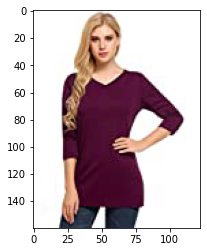

Title:  POGT Women's Long Sleeve Loose Fit High Low Lace Trim Hem Blouse Tops T-shirt (L--US 10, Gray)
Distance 0.1068456276826644


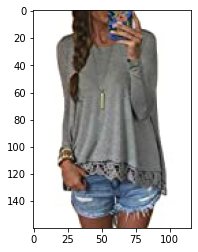

Title:  Zeagoo Women's Plus Size V-neck Solid Blouse Shirt 3/4 Sleeve Tunic Top Tee Red Medium
Distance 0.10729457370694842


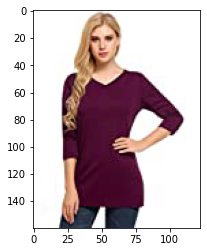

Title:  Kearia Women Short Sleeve Star Print Loose Fit High low Hem T Shirt Tunic Top Blouse
Distance 0.1076202650922535


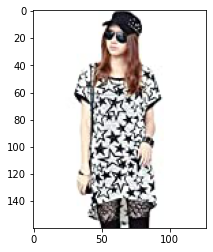

In [521]:
tf_idf_color_brand_model(15143,10,1,1)

Title:  Azules Women's Solid Color Rayon Span High Low Cap Sleeved Tunic - Rust, L
Distance 0.0


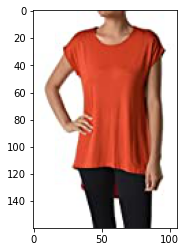

Title:  Women'S Rayon Span High & Low Short Sleeves Tunic - Solid (MEDIUM, Indigo Blue)
Distance 0.0019277862819621243


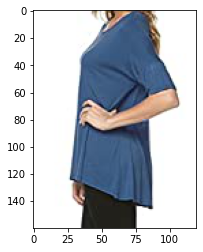

Title:  Hount Womens V-neck Long Sleeve Floral Print High Low Hem Blouse Tops (L, Red)
Distance 0.002051095131415428


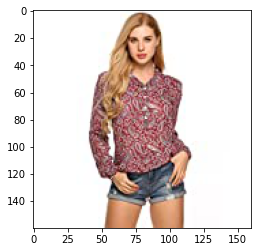

Title:  Bignow Plus Size Tshirt Tops Solid White Short Sleeved Blouse Wide Hem 4XL White
Distance 0.0020609605607319888


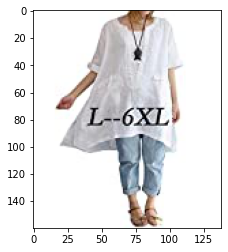

Title:  Women'S Rayon Span High & Low Short Sleeves Tunic - Solid (LARGE, Coffee)
Distance 0.0020778638425731993


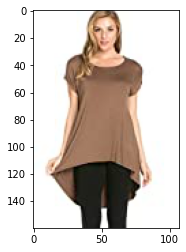

Title:  Women's Rayon Span Comfortable 3/4 Sleeve Tunic Top- Solid (Medium, Navy)
Distance 0.0020890849192067118


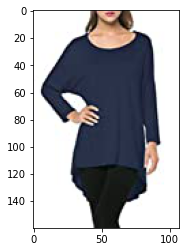

Title:  Zeagoo Women's Casual 3/4 Sleeve V Neck Top Tee Solid Color Tunic Top Blouse Plus Size
Distance 0.002097567442676219


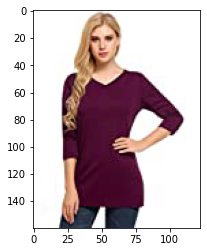

Title:  POGT Women's Long Sleeve Loose Fit High Low Lace Trim Hem Blouse Tops T-shirt (L--US 10, Gray)
Distance 0.0021157550036171166


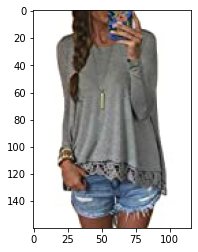

Title:  Zeagoo Women's Plus Size V-neck Solid Blouse Shirt 3/4 Sleeve Tunic Top Tee Red Medium
Distance 0.002124645023899969


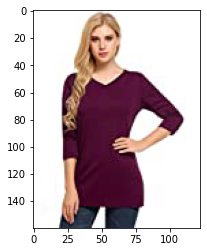

Title:  Kearia Women Short Sleeve Star Print Loose Fit High low Hem T Shirt Tunic Top Blouse
Distance 0.002131094358262446


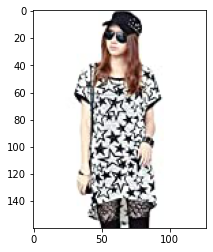

In [522]:
tf_idf_color_brand_model(15143,10,1,100)

Title:  Daniel Rainn Navy Womens Plus V-Neck Printed Blouse Blue 1X
Distance 0.0


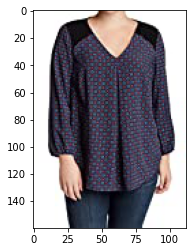

Title:  Daniel Rainn Printedd Chiffon Women's Plus Blouse Red 3X
Distance 0.0018264425650607833


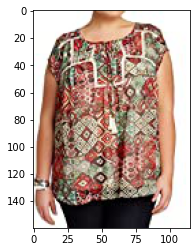

Title:  Everleigh Women's Plus Long Sleeve Lace Inset Print Blouse 1x Navy Black
Distance 0.0018486234444094103


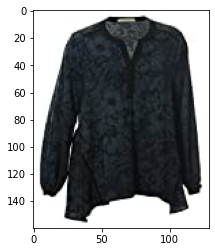

Title:  MSK Women's Plus Floral Print Rhinestone-Side Blouse Blue 1X
Distance 0.0019800582317057894


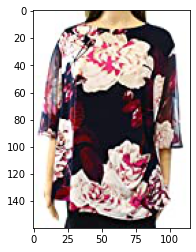

Title:  Daniel Rainn Womens Plus Eyelash-Lace Trim Blouse Black 2X
Distance 0.0020105133999247663


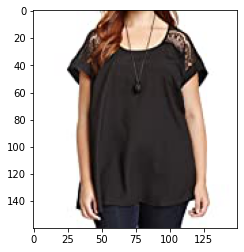

Title:  daniel rainn Black Women's Printed Split-Neck Blouse Beige XS
Distance 0.0020202263025410126


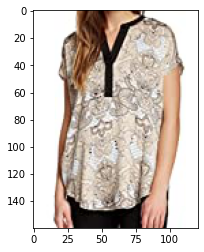

Title:  LYNN RITCHIE Womens Long Vest With Pocket Sz XL Navy White Grey Striped 280087E
Distance 0.002039993361141557


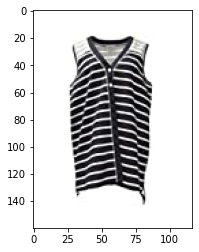

Title:  Pleione Navy Womens Draped-Back Knit Curved-Hem Blouse Blue XS
Distance 0.0021289161609847093


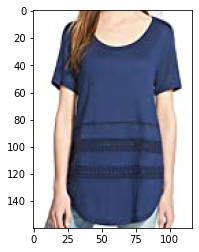

Title:  ELA USA Womens V-Neck Cut Out Sleeve Detail Knit Top Plus Sz 1X Blue 280153E
Distance 0.0021476369374914353


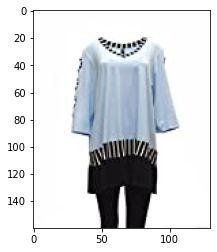

Title:  Tahari by ASL Women's Plus Tank Cami V-Neck Top Pink 1X
Distance 0.0021648676367781185


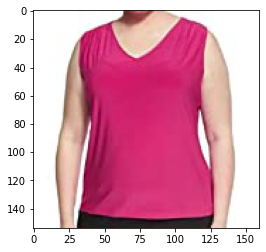

In [523]:
tf_idf_color_brand_model(12920,10,1,100)

<a id="19"></a>
## Extract Features with CNN

### When feature extracted image considered

* Increase in similarity distance found
* Recommended products were completly different and non relevant.
* Performance deterioted when higher weights were assignrd.

In [538]:
import tensorflow.keras
import pandas as pd
import sklearn as sk
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Flatten, Dense
from tensorflow.keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

<a id="20"></a>
### Use Pre-Trained Models

In [546]:
# VGG16 models without the classifier part of the model by specifying the “include_top” argument to “False”,
model = applications.VGG16(weights='imagenet', include_top=False)
model.summary()

In [566]:
#Function to compute VGG-16 CNN for image feature extraction

# dimensions of our images.
img_width, img_height = 224, 224

top_model_weights_path = 'bottleneck_fc_model.h5'
train_data_dir = '16k_images/'
nb_train_samples = 16032
epochs = 50
batch_size = 1

def feature_exract():

    asins = []
    datagen = ImageDataGenerator(rescale=1. / 255)
    
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    for i in generator.filenames: # take labels
        asins.append(i[2:-5])

    cnn_features = model.predict_generator(generator, nb_train_samples // batch_size)
    cnn_features = cnn_features.reshape((nb_train_samples,25088))
    
    np.save(open('cnn_features.npy', 'wb'), cnn_features)
    np.save(open('cnn_feature_asins.npy', 'wb'), np.array(asins))

In [585]:
#load the features and corresponding ASINS info.
cnn_features = np.load('cnn_features.npy')
cnn_feature_asins = np.load('cnn_feature_asins.npy')
cnn_feature_asins = list(cnn_feature_asins)

In [586]:
# load the original 16K dataset
df_asins = list(data6['asin'])

In [635]:
def cnn(ID,num_results):
    doc_id = asins.index(df_asins[ID])
    
    # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise_distances.html
    # Compute the distance matrix from a vector array X and optional Y.
    # sklearn.metrics.pairwise.pairwise_distances(X, Y=None, metric='euclidean')
    pairwise_distance = pairwise_distances(cnn_features,cnn_features[ID].reshape(1,-1))
    
    # Returns the indices that would sort an array.
    # we make flatten the matris to make in one arary.
    indices = np.argsort(pairwise_distance.flatten())[0:num_results]
    
    # hide the smallest euclidean distance
    # it was not necessary for prediction, just want to show distance
    smallest_distance  = np.sort(pairwise_distance.flatten())[0:num_results]
    
    # use indices in dataset to find real positions
    df_indices = list(data6.index[indices])
    
    for i in range(len(df_indices)):
        rows = data6[['medium_image_url','title']].loc[data6['asin']==asins[indices[i]]]
        
        for indx, row in rows.iterrows():
            print("Title: ",row['title'])
            print("Distance",smallest_distance[i])

            # take image's url
            url = row['medium_image_url']
            response = requests.get(url)
            img = Image.open(BytesIO(response.content))
            # show image
            plt.imshow(img)
            plt.show()
            

Title:  Red Lao Laos Silk blend Sleeveless Classic Neckline Blouse Tos Size 40 L BL40A
Distance 0.0


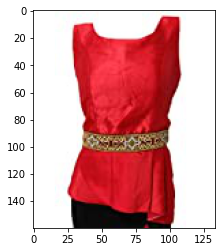

Title:  Pink Lao Laos Laotian Sleeveless Blouse Classic Neckline Tops Size 36 M SL36B
Distance 37.68794


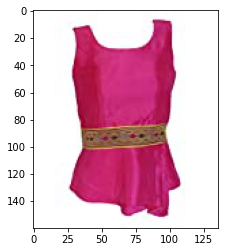

Title:  Pink Lao Laos Laotian Sleeveless Blouse Tops Size 38 M SL38B
Distance 41.97822


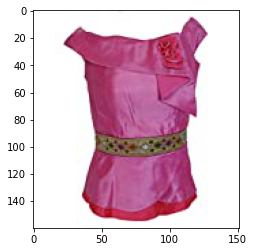

Title:  Pink Lao Laos Single Sleeveless Blouse Classic Neckline Tops Size 38 M SL38H
Distance 42.150955


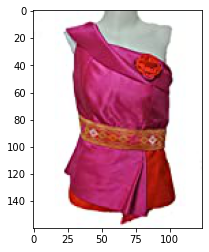

Title:  Yellow Lao Laos Laotian Sleeveless Blouse Tops Size 36 M SL36I
Distance 43.22199


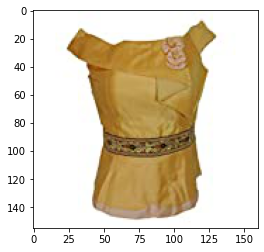

Title:  mauve purple Lao Laos Sleeveless Blouse Classic Neckline Tops Size 34 S SL34C
Distance 44.162327


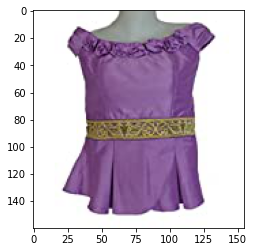

Title:  Dark Brown Lao Laos Laotian Sleeveless Blouse Classic Neckline Size 36 M SL36F
Distance 44.570557


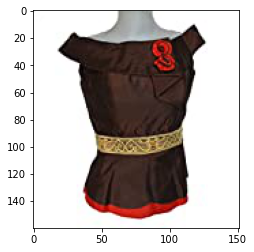

Title:  Pink purple Lao Laos Sleeveless Blouse V-Neckline Tops Size 34 S SL34D
Distance 45.393356


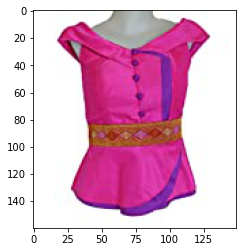

Title:  Red Lao Laos Sleeveless Blouse Classic Neckline Floral Lace Tops Size 38 M SL38G
Distance 45.461674


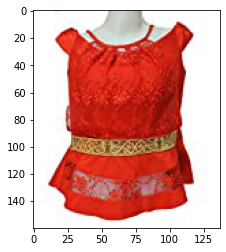

Title:  Lot 4 Lao Laos Laotian SLeeveless Blouse Top size 34 S Free expited shipping
Distance 45.482292


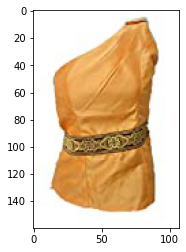

In [636]:
cnn(12530,10)

Title:  Stoosh Juniors' Multi-Print Asymmetrical Swing Tank Top
Distance 3.3036247e-06


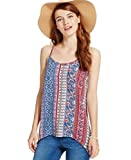

Title:  Ideology Women's T-Back Burnout Tank Top Striped Pink (XS)
Distance 38.665554


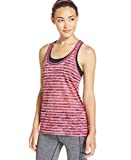

Title:  Ideology T-Back Burnout Tank Red 2XL
Distance 39.242287


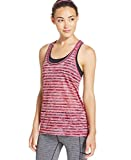

Title:  Energie Juniors' Printed Reversible Camisole XL
Distance 41.419464


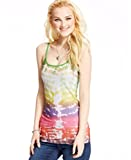

Title:  DKNYC Tank Top Printed Overlay 168-171, Periwinkle
Distance 41.890137


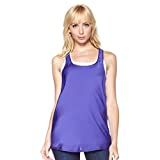

Title:  Kiind Of Crossback Printed Top Small
Distance 41.929054


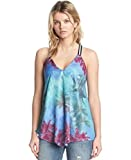

Title:  Soft Joie Womens Bromley Striped Hoodie Khaki/White Medium
Distance 42.193443


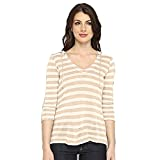

Title:  RAG & BONE / JEAN ARIA TANK Large Navy White Stripe
Distance 42.255936


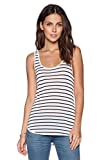

Title:  Nautica Waffle Knit Striped Henley Lounge Shirt L, Fog Heather
Distance 42.858368


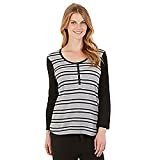

In [625]:
cnn(7766,10)

Title:  BU University Mascot Huskies Ladies Sport Vest
Distance 4.672031e-06


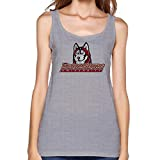

Title:  LOOIN Women's NCAA Providence Friars Athletic Team Logo Top [Apparel]
Distance 13.584211


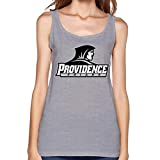

Title:  Johns Hopkins University Women Sport Vest
Distance 17.561441


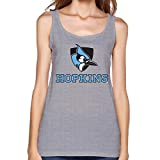

Title:  Yooper Map Women Tank Top Sleeveless Vest
Distance 17.71248


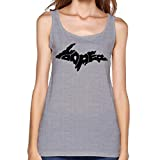

Title:  Women's Juventus Tanks T-shirts For Womens
Distance 19.824734


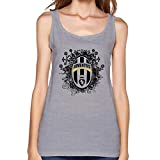

Title:  Women Juventus Tankshirt For Womens
Distance 19.824734


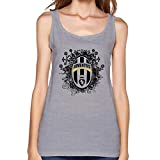

Title:  Niceda Women's Owsla Tank Top T Shirt
Distance 21.69955


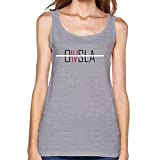

In [627]:
cnn(6677,10)

Title:  Rag & Bone Womens Jean Stretch Printed T-Shirt White M
Distance 42.349422


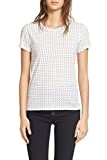

Title:  Bailey44 Womens Core Solid T-Shirt, S, Red
Distance 42.630978


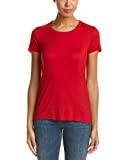

Title:  Superdry Women's No 6 Entry Women's White T-Shirt in Size S White
Distance 43.13862


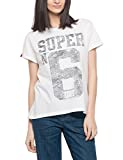

Title:  Brooks Brothers Womens Shell, 8, Blue
Distance 43.207336


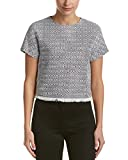

In [628]:
cnn(9933,10)

Title:  FOI Indian Vintage Look Rayon Top Hippie Blouse Blusa Dress Women Chemisier
Distance 1.3486991e-06


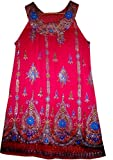

Title:  FOI Indian Vintage Look Women Chemisier Rayon Top Hippie Blouse Blusa Dress
Distance 37.635326


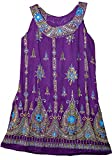

Title:  FYLO Womens Size Large Crochet Tank Top, Black
Distance 42.307228


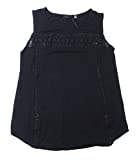

Title:  MICHAEL Michael Kors Women's Tie-Dyed Long Sleeve Tee, (Poppy, Medium)
Distance 42.704857


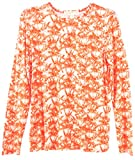

Title:  Kenneth Cole Reaction Ladies Size Medium Sleeveless Scoop Tank Top Black
Distance 42.883877


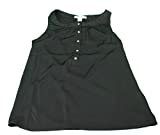

Title:  Bandolino Womens Erin Henley Top Small Sweet Safron
Distance 43.751537


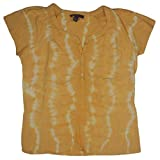

Title:  Pure Karma Pure Karma Girls Wns Racerback Tank, Black, black, X-Small
Distance 44.078083


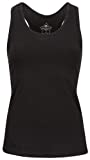

In [629]:
cnn(3399,10)

<a id="21"></a>
## Combine Models
* Combination of weighted vector [text + (brand + color) + image] is used to get similar products.

In [643]:
def combine_models(ID,num_results,w1,w2,w3):
    # w1: weight for tfidf
    # w2: weight for color&brand features
    # w3: cnn weight
    
    # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise_distances.html
    # Compute the distance matrix from a vector array X and optional Y.
    # sklearn.metrics.pairwise.pairwise_distances(X, Y=None, metric='euclidean')
    tf_idf_distance = pairwise_distances(tf_idf_title,tf_idf_title[ID])
    color_brand_distance = pairwise_distances(color_brand,color_brand[ID])
    cnn_distance = pairwise_distances(cnn_features,cnn_features[ID].reshape(1,-1))    
    #
    pairwise_distance = (w1 * tf_idf_distance +  w2 * color_brand_distance + w3 * cnn_distance)/float(w1 + w2 + w3)
    
    # Returns the indices that would sort an array.
    # we make flatten the matris to make in one arary.
    indices = np.argsort(pairwise_distance.flatten())[0:num_results]
    
    # hide the smallest euclidean distance
    # it was not necessary for prediction, just want to show distance
    smallest_distance  = np.sort(pairwise_distance.flatten())[0:num_results]
    
    # use indices in dataset to find real positions
    df_indices = list(data6.index[indices])
    
    for i in range(len(df_indices)):
        print("Title: ",data6['title'].loc[df_indices[i]])
        print("Distance",smallest_distance[i])
                                           
        # take image's url
        url = data6['medium_image_url'].loc[df_indices[i]]
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        # show image
        plt.imshow(img)
        plt.show()